In [1]:
import numpy as np
import random
import os
import tqdm
import seaborn as sns
import pandas as pd
from keras.utils import load_img
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense

([<matplotlib.patches.Wedge at 0x2501b9968d0>,
 [Text(6.735557395310444e-17, 1.1, 'Cats'),
  Text(-2.0206672185931328e-16, -1.1, 'Dogs')],
 [Text(3.6739403974420595e-17, 0.6, '50%'),
  Text(-1.1021821192326178e-16, -0.6, '50%')])

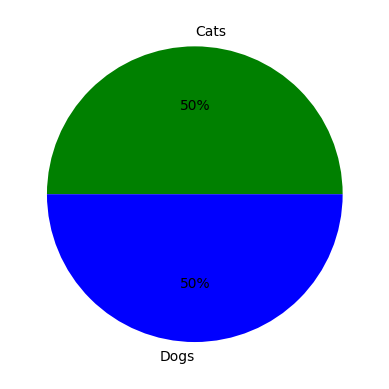

In [2]:
class_names = ["Cats", "Dogs"]
n_cats = len(os.listdir("data/PetImages/Cat"))
n_dogs = len(os.listdir("data/PetImages/Dog"))
images = [n_cats, n_dogs]
plt.pie(images, labels = class_names, colors=['green', 'blue'], autopct='%1.f%%')

In [3]:
img_path = []
label = []
for class_name in os.listdir('data/PetImages'):
    for path in os.listdir('data/PetImages/'+class_name):
        if class_name == 'Cat':
            label.append(0)
        else:
            label.append(1)
        img_path.append(os.path.join('data/PetImages', class_name, path))

In [4]:
df = pd.DataFrame()
df['Images'] = img_path
df['labels'] = label
df = df.sample(frac=1).reset_index(drop=True)
df.head()

,Images,labels
0,data/PetImages\Cat\8368.jpg,0
1,data/PetImages\Cat\8213.jpg,0
2,data/PetImages\Dog\2868.jpg,1
3,data/PetImages\Dog\3148.jpg,1
4,data/PetImages\Dog\3842.jpg,1


In [42]:
df['labels'] = df['labels'].astype('string')

In [43]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24998 entries, 0 to 25001
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Images  24998 non-null  object
 1   labels  24998 non-null  string
dtypes: object(1), string(1)
memory usage: 585.9+ KB


In [29]:
# delete db file
for i in df['Images']:
    if '.jpg' not in i:
        print(i)

data/PetImages\Dog\Thumbs.db
data/PetImages\Cat\Thumbs.db


In [30]:
df = df[df['Images']!='data/PetImages\Dog\Thumbs.db']
df = df[df['Images']!='data/PetImages\Cat\Thumbs.db']
len(df)

25000

In [41]:
import PIL
l =[]
for image in df['Images']:
    try:
        img = PIL.Image.open(image)
    except:
        l.append(image)
l

C:\Users\kumar\anaconda3\Lib\site-packages\PIL\TiffImagePlugin.py:949: UserWarning: Truncated File Read
  warnings.warn(str(msg))


[]

In [38]:
df = df[df['Images']!='data/PetImages\\Cat\\666.jpg']
df = df[df['Images']!='data/PetImages\\Dog\\11702.jpg']
len(df)

24998

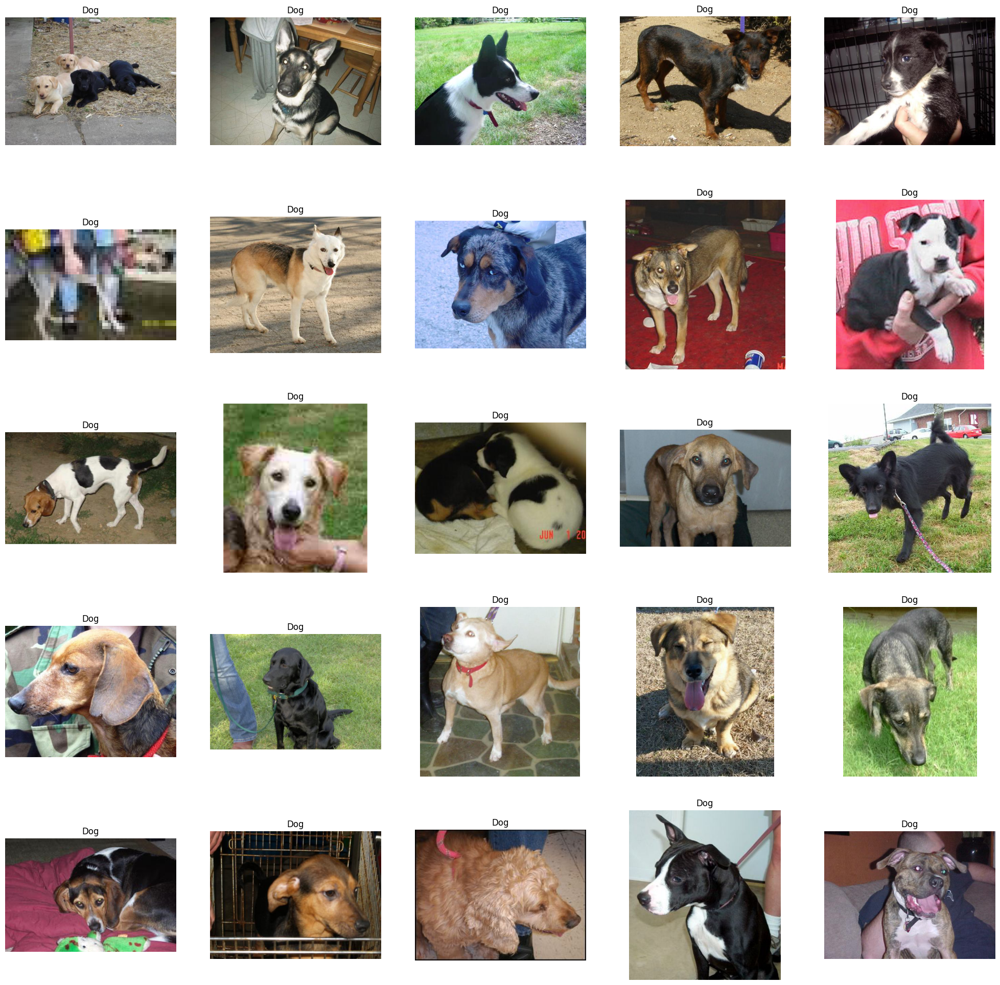

In [5]:
plt.figure(figsize=(25,25))

temp = df[df['labels']==1]['Images']
start = random.randint(0, len(temp))
files = temp[start:start+25]
for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title("Dog")
    plt.axis('off')

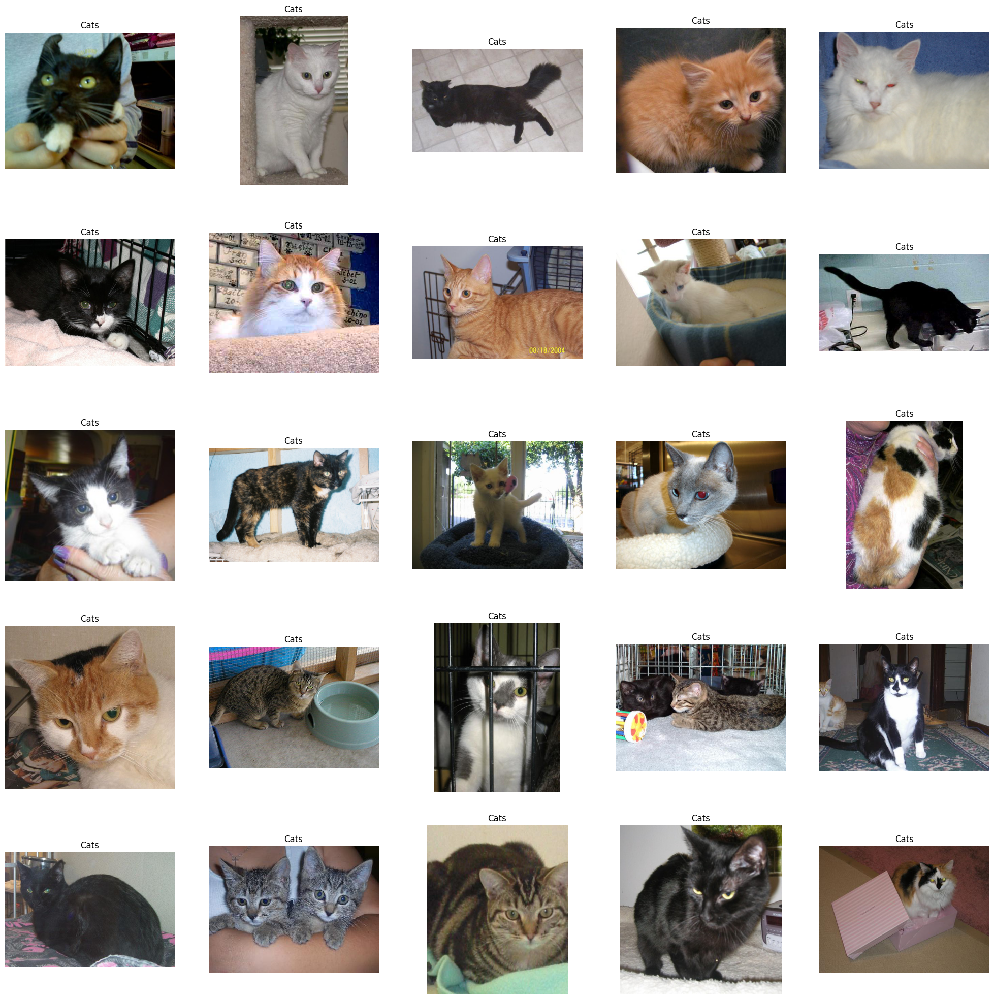

In [6]:
plt.figure(figsize=(25,25))

temp = df[df['labels']==0]['Images']
start = random.randint(0, len(temp))
files = temp[start:start+25]
for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    #img = np.array(img)
    plt.imshow(img)
    plt.title("Cats")
    plt.axis('off')

In [44]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2, random_state=42)

In [45]:
train.head()

,Images,labels
23290,data/PetImages\Dog\12456.jpg,1
17784,data/PetImages\Cat\9998.jpg,0
1020,data/PetImages\Cat\3537.jpg,0
12646,data/PetImages\Cat\1130.jpg,0
1533,data/PetImages\Cat\4451.jpg,0


In [46]:
from keras.preprocessing.image import ImageDataGenerator
train_generator = ImageDataGenerator(
    rescale=1./255, #Normalization of images
    rotation_range=40, #augmentation of images
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

val_generator = ImageDataGenerator(rescale=1./255)

train_iterator = train_generator.flow_from_dataframe(
    train,
    x_col="Images",
    y_col="labels",
    target_size=(128, 128),
    batch_size=128,
    class_mode='binary'
)

val_iterator = val_generator.flow_from_dataframe(
    test,
    x_col="Images",
    y_col="labels",
    target_size=(128, 128),
    batch_size=128,
    class_mode='binary'
)

Found 19998 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


In [47]:
from keras import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense

model = Sequential([
    Conv2D(16, (3,3), activation='relu', input_shape=(128,128,3)),
    MaxPool2D((2,2)),
    Conv2D(32, (3,3), activation='relu'),
    MaxPool2D((2,2)),
    Flatten(),
    Dense(512, activation='relu'),
    Dense(1, activation='sigmoid')
])

In [48]:
model.compile(optimizer='adam', loss="binary_crossentropy", metrics=["accuracy"])
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 126, 126, 16)      448       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 63, 63, 16)       0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 61, 61, 32)        4640      
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 30, 30, 32)       0         
 2D)                                                             
                                                                 
 flatten_3 (Flatten)         (None, 28800)             0         
                                                                 
 dense_6 (Dense)             (None, 512)              

In [49]:
history = model.fit(train_iterator, epochs=50, validation_data=val_iterator)

Epoch 1/50
  1/157 [..............................] - ETA: 3:45 - loss: 0.6922 - accuracy: 0.5469

C:\Users\kumar\anaconda3\Lib\site-packages\PIL\TiffImagePlugin.py:949: UserWarning: Truncated File Read
  warnings.warn(str(msg))


157/157 [==============================] - 142s 899ms/step - loss: 0.7042 - accuracy: 0.5935 - val_loss: 0.6117 - val_accuracy: 0.6720
Epoch 2/50
157/157 [==============================] - 143s 911ms/step - loss: 0.5801 - accuracy: 0.6997 - val_loss: 0.5623 - val_accuracy: 0.7052
Epoch 3/50
157/157 [==============================] - 148s 939ms/step - loss: 0.5490 - accuracy: 0.7213 - val_loss: 0.5347 - val_accuracy: 0.7372
Epoch 4/50
157/157 [==============================] - 141s 899ms/step - loss: 0.5282 - accuracy: 0.7369 - val_loss: 0.5036 - val_accuracy: 0.7614
Epoch 5/50
157/157 [==============================] - 139s 887ms/step - loss: 0.5143 - accuracy: 0.7459 - val_loss: 0.5230 - val_accuracy: 0.7486
Epoch 6/50
157/157 [==============================] - 138s 879ms/step - loss: 0.4938 - accuracy: 0.7590 - val_loss: 0.5196 - val_accuracy: 0.7462
Epoch 7/50
157/157 [==============================] - 139s 883ms/step - loss: 0.4834 - accuracy: 0.7644 - val_loss: 0.4615 - val_accura

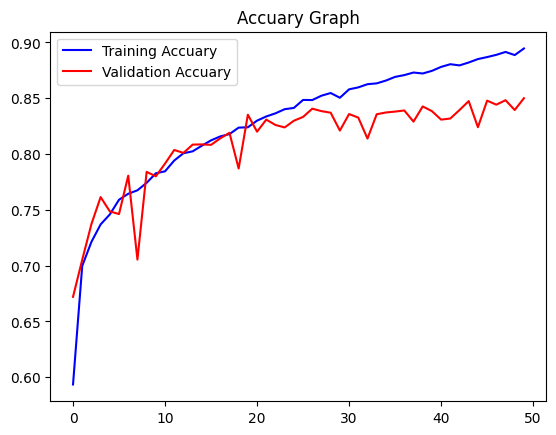

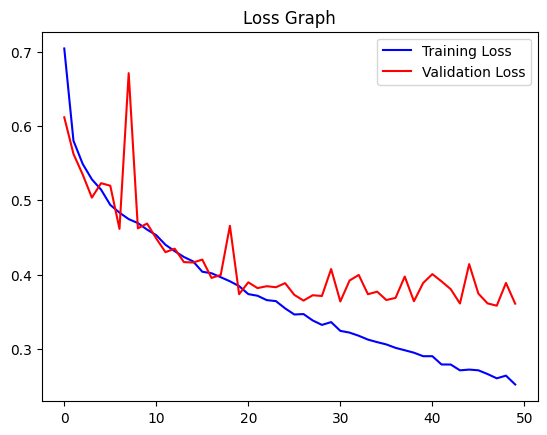

In [50]:
# Visualization of results

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label="Training Accuary")
plt.plot(epochs, val_acc, 'r', label="Validation Accuary")
plt.title('Accuary Graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(epochs, loss, 'b', label="Training Loss")
plt.plot(epochs, val_loss, 'r', label="Validation Loss")
plt.title('Loss Graph')
plt.legend()
plt.show()

In [51]:
model.save("models/model.h5")

1/1 [==============================] - 0s 55ms/step
0.0073707984
Cat


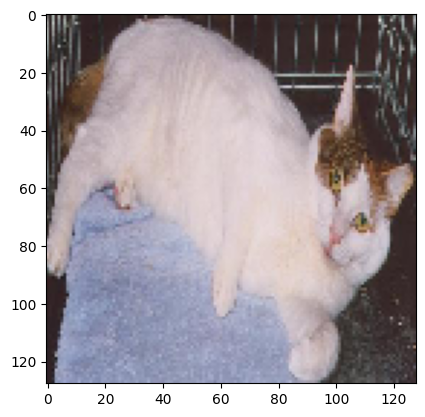

In [72]:
import numpy as np
import random
from tensorflow.keras.preprocessing import image

img_path = df["Images"][random.randint(0, len(df["Images"]))]

img = image.load_img(img_path, target_size=(128, 128))
plt.imshow(img)
img_array = image.img_to_array(img)
img_array = img_array / 255.0          # SAME rescaling
img_array = np.expand_dims(img_array, axis=0)

prediction = model.predict(img_array)
print(prediction[0][0])
print("Dog" if prediction[0][0] >0.5 else "Cat")